## Task 1: Baseline Implementation (50 pts)

In this task our descriptors are 32x32 thumbnails of images. Algorithm:
- Compute image descriptors for the training set of face images.
- Compute an image descriptor for the query face.
- Retrieve the training image that is most similar to the query.
- Transfer color from the matched training image to the query image.

In [1]:
from IPython.display import Image
import numpy as np
import cv2
from display_helper import multiple_display

import time

from os import listdir
from os.path import isfile, join

test_set_files = [join('testset', f) for f in listdir('testset') if isfile(join('testset', f))]
train_set_files = [join('trainset', f) for f in listdir('trainset') if isfile(join('trainset', f))]

def compute_greyscale_32x32_descryptors(files):
    descryptors = []
    for img_path in files:
        img = cv2.imread(img_path, 0)
        dsc = cv2.resize(img, (32, 32)).astype(np.float32)
        descryptors.append([dsc, img_path])
    return descryptors

Lets make our descryptors:

In [2]:
preprocessing1_time = time.clock()

test_set_32x32_descryptors = compute_greyscale_32x32_descryptors(test_set_files)
train_set_32x32_descryptors = compute_greyscale_32x32_descryptors(train_set_files)

preprocessing1_time = time.clock()-preprocessing1_time

Example:

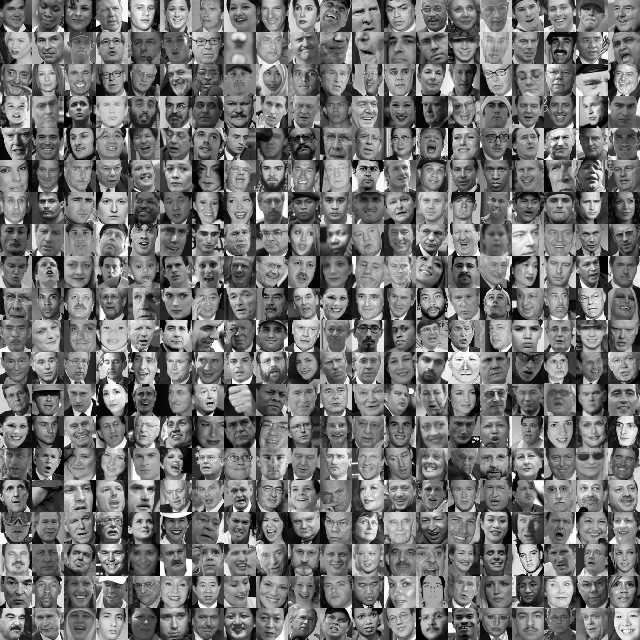

In [3]:
t = train_set_32x32_descryptors
cv2.imwrite('output/tmp.png', multiple_display([ [t[y*20 + x][0] for x in range(0, 20)] for y in range(0,20) ]))
Image('output/tmp.png')

Lets define our metric and find most similar image:

In [4]:
def sum_of_squared_differences(img1, img2):
    diff = img1-img2
    return (diff**2).mean()

def find_most_similar_ssd(input_dsc, img_set):
    most_similar = None
    most_similar_ssd = float('inf')
    for dsc, img_path in img_set:
        ssd = sum_of_squared_differences(input_dsc, dsc)
        if ssd < most_similar_ssd:
            most_similar_ssd = ssd
            most_similar = (dsc, img_path)
    return most_similar        

This is how we transfer color:

In [5]:
def transfer_color(img_src, img_dest):
    if(img_src.shape != img_dest.shape):
        (h,w,c) = img_dest.shape
        img_src_valid = cv2.resize(img_src, (w, h))
    else:
        img_src_valid = img_src
    img_src_YCrCb = cv2.cvtColor(img_src_valid, cv2.COLOR_BGR2YCR_CB)
    img_dest_YCrCb = cv2.cvtColor(img_dest, cv2.COLOR_BGR2YCR_CB)
    out_YCrCb = img_dest_YCrCb.copy()
    out_YCrCb[:,:,1] = img_src_YCrCb[:,:,1]
    out_YCrCb[:,:,2] = img_src_YCrCb[:,:,2]
    out_BGR = cv2.cvtColor(out_YCrCb, cv2.COLOR_YCR_CB2BGR)
    return out_BGR

Result:

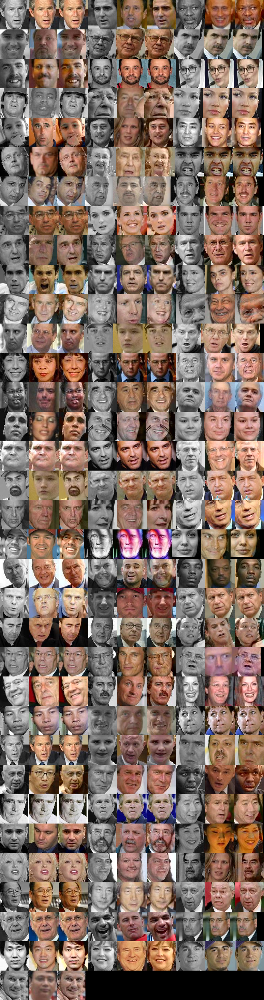

In [6]:
find1_time = 0
output_display_array = []
for (dsc_dest, dest_path) in test_set_32x32_descryptors:
    find1_start = time.clock()
    (_, src_path) = find_most_similar_ssd(dsc_dest, train_set_32x32_descryptors)
    find1_time += time.clock()-find1_start
    img_src = cv2.imread(src_path)
    img_dest = cv2.imread(dest_path)
    img_out = transfer_color(img_src, img_dest)
    output_display_array += [img_dest,img_src,img_out]

a = output_display_array
output_display_array = [a[i:i + 9] for i in range(0, len(a), 9)]

cv2.imwrite('output/colorized.png', multiple_display(output_display_array))
Image('output/colorized.png')

## Task 2: Reduce dimensionality with PCA (50 pts)

The flow of algorithmis the same as before but we will change descriptors. We will use some of principal components of images instead of 32x32 images, to speed up the comparision process.

To compute PCA we will use openCV implementation.

In [7]:
def prepare_data_PCA(dsc_32x32_with_filepaths):
    data_matrix = np.zeros((len(dsc_32x32_with_filepaths), 32*32), np.float32)
    for i in range(0, len(dsc_32x32_with_filepaths)):
        data_matrix[i,:] = dsc_32x32_with_filepaths[i][0].flatten()
    filenames = np.array(dsc_32x32_with_filepaths)[...,1]
    return data_matrix, filenames

def compute_PCA(data_matrix, max_components):
    mean, eigenvectors = cv2.PCACompute(data_matrix, maxComponents=max_components)
    return mean, eigenvectors

def compute_PCA_descryptors(mean, eigenvectors, data_matrix, filenames):
    pc_data_matrix = cv2.PCAProject(data_matrix, mean, eigenvectors)
    descryptors = zip(pc_data_matrix, filenames)
    return descryptors

Lets make our new descryptors:

In [8]:
preprocessing2_time = time.clock()

train_data_matrix, train_filenames = prepare_data_PCA(train_set_32x32_descryptors)
mean, eigenvectors = compute_PCA(train_data_matrix, 19)
train_set_PCA_descryptors = compute_PCA_descryptors(mean, eigenvectors, train_data_matrix, train_filenames)

test_data_matrix, test_filenames = prepare_data_PCA(test_set_32x32_descryptors)
test_set_PCA_descryptors = compute_PCA_descryptors(mean, eigenvectors, test_data_matrix, test_filenames)

preprocessing2_time = time.clock()-preprocessing2_time+preprocessing1_time

And time for results:

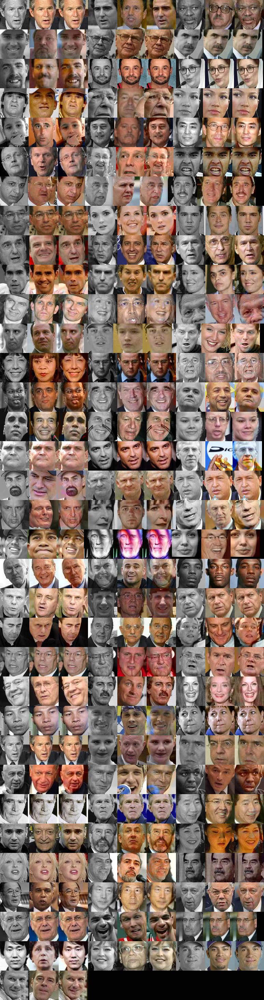

In [9]:
find2_time = 0

output_display_array = []
for dsc_dest, dest_path in test_set_PCA_descryptors:
    find2_start = time.clock()
    (_, src_path) = find_most_similar_ssd(dsc_dest, train_set_PCA_descryptors)
    find2_time += time.clock() - find2_start
    img_src = cv2.imread(src_path)
    img_dest = cv2.imread(dest_path)
    img_out = transfer_color(img_src, img_dest)
    output_display_array += [img_dest,img_src,img_out]

a = output_display_array
output_display_array = [a[i:i + 9] for i in range(0, len(a), 9)]

cv2.imwrite('output/colorized.png', multiple_display(output_display_array))
Image('output/colorized.png')

### Performance


In [10]:
print "Preprocessing1:", preprocessing1_time
print "Find1:", find1_time

print "Preprocessing2:", preprocessing2_time
print "Find2:", find2_time

Preprocessing1: 1.34667
Find1: 23.584348
Preprocessing2: 37.106707
Find2: 18.804654
